<a href="https://colab.research.google.com/github/Ziad-o-Yusef/Deep-learning-notes/blob/main/17_DCGANs_Brain_MRI_Creation_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 
import os 
import tensorflow as tf
import math 
from tqdm import tqdm 
from google.colab import drive 

In [2]:
drive.mount('/content/drive')
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/Kaggle_MyAPI'
! kaggle datasets download -d navoneel/brain-mri-images-for-brain-tumor-detection

Mounted at /content/drive
 60% 9.00M/15.1M [00:00<00:00, 36.1MB/s]
100% 15.1M/15.1M [00:00<00:00, 57.0MB/s]


In [8]:
%mkdir /content/dataset

In [9]:
%cd /content/dataset

/content/dataset


In [ ]:
! unzip /content/brain-mri-images-for-brain-tumor-detection.zip

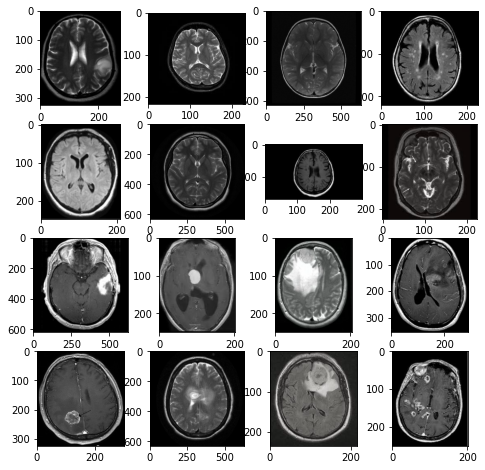

In [11]:
dir = '/content/dataset'
dirs = os.listdir(dir)
imshow_dirs = []
for i in dirs : 
    step = os.listdir(dir+ '/'+ i)
    for x in range(8):
        try : 
          imshow_dirs.append(dir+ '/' + i + '/' + step[x])
        except : 
          continue
fig, ax = plt.subplots(4,4,figsize=(8,8))
for n in range(4):
    for m in range(4):
        path =imshow_dirs[m + 4*n]
        image = cv2.imread(str(path))
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

In [12]:
cv2.imread(imshow_dirs[0]).shape


(326, 276, 3)

In [59]:
X = []
Y = []
dirs = ['/content/dataset/no','/content/dataset/yes']
for i in dirs:
    path = i
    for x in os.listdir(path):
        img = cv2.imread(path + '/'+ x)
        img = cv2.resize(img,(128, 128), interpolation=cv2.INTER_AREA)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).reshape(128,128,1)
        X.append(img)
        Y.append(i)
X = np.array(X)
Y = np.array(Y)
X.shape , Y.shape

((253, 128, 128, 1), (253,))

In [29]:
X = (X.astype(np.float32) - 127.5)/127.5

In [63]:
np.random.seed(42)
tf.random.set_seed(42)
random_dim = 100
image_dim = 128*128*1

In [16]:
from tensorflow.keras.layers import Dense,Reshape,Dropout,LeakyReLU,Flatten,BatchNormalization,Conv2D,Conv2DTranspose
from tensorflow.keras.models import Sequential

In [93]:
def get_generator():    
    generator = Sequential()
    generator.add(Dense(64* 64 * 128, input_shape=[random_dim]))
    generator.add(Reshape([64, 64, 128]))
    generator.add(BatchNormalization())
    generator.add(Conv2DTranspose(64, kernel_size=2, strides=2, padding="same",
                                    activation="relu"))
    generator.add(BatchNormalization())
    generator.add(Conv2DTranspose(1, kernel_size=5, strides=1, padding="same",
                                    activation="tanh"))
    generator.compile(loss="binary_crossentropy", optimizer="adam")
    return generator
get_generator().summary()

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_41 (Dense)            (None, 524288)            52953088  
                                                                 
 reshape_29 (Reshape)        (None, 64, 64, 128)       0         
                                                                 
 batch_normalization_92 (Bat  (None, 64, 64, 128)      512       
 chNormalization)                                                
                                                                 
 conv2d_transpose_91 (Conv2D  (None, 128, 128, 64)     32832     
 Transpose)                                                      
                                                                 
 batch_normalization_93 (Bat  (None, 128, 128, 64)     256       
 chNormalization)                                                
                                                     

In [94]:
def get_discriminator():    
  discriminator = Sequential()
  discriminator.add(Conv2D(64, kernel_size=5, strides=2, padding="same",
                          activation=LeakyReLU(0.3),
                          input_shape=[128,128,1]))
  discriminator.add(Dropout(0.5))
  discriminator.add(Conv2D(128, kernel_size=5, strides=2, padding="same",
                          activation=LeakyReLU(0.3)))
  discriminator.add(Dropout(0.5))
  discriminator.add(Flatten())
  discriminator.add(Dense(1, activation="sigmoid"))
  discriminator.compile(loss="binary_crossentropy", optimizer="adam")
  return discriminator

In [77]:
def get_gan_network(disc,gen):
  disc.trainable = False
  gan_input = tf.keras.layers.Input(shape=(random_dim))
  x = gen(gan_input)
  gan_output = disc(x)
  gan = tf.keras.models.Model(inputs=gan_input, outputs=gan_output)
  gan.compile(loss='binary_crossentropy', optimizer='adam')
  return gan

In [95]:
def training(epochs = 5, batch_size = 128):

  batch_count = X.shape[0] / batch_size

  generator = get_generator()
  discriminator = get_discriminator()
  gan = get_gan_network(discriminator,generator)

  for epoch in range(1, epochs+1):
    print('-'*25, 'Epoch %d' % epoch, '-'*25)

    for _ in tqdm(range(int(batch_count))):
      noise = np.random.normal(0, 1, size=[batch_size, random_dim])
      image_batch = X[np.random.randint(0, X.shape[0], size=batch_size)]

      generated_images = generator.predict(noise)
      concat = np.concatenate([image_batch, generated_images])

      y_dis = np.zeros(2*batch_size)
      y_dis[:batch_size] = 0.9

      discriminator.trainable = True
      discriminator.train_on_batch(concat, y_dis)

      noise = np.random.normal(0, 1, size=[batch_size, random_dim])
      y_gen = np.ones(batch_size)
      discriminator.trainable = False
      gan.train_on_batch(noise, y_gen)
      if epoch == 1 or epoch % 20 == 0:
        plot_generated_images(epoch, generator)

In [96]:
def plot_generated_images(epoch, generator, examples=36, dim=(6, 6), figsize=(6, 6)):
    noise = np.random.normal(0, 1, size=[examples, random_dim])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples, int(math.sqrt(image_dim)),int(math.sqrt(image_dim)))
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image_epoch_%d.png' % epoch)

------------------------- Epoch 1 -------------------------


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


------------------------- Epoch 2 -------------------------


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


------------------------- Epoch 3 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 4 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 5 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 6 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


------------------------- Epoch 7 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 8 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 9 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 10 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 11 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


------------------------- Epoch 12 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 13 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 14 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 15 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 16 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 17 -------------------------


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


------------------------- Epoch 18 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 19 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


------------------------- Epoch 20 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 21 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 22 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 23 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


------------------------- Epoch 24 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 25 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 26 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


------------------------- Epoch 27 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 28 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 29 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 30 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 31 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 32 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 33 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 34 -------------------------


100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


------------------------- Epoch 35 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 36 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 37 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 38 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 39 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 40 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 41 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 42 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 43 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


------------------------- Epoch 44 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 45 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 46 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 47 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 48 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 49 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 50 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 51 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 52 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 53 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 54 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 55 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 56 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 57 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


------------------------- Epoch 58 -------------------------


100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


------------------------- Epoch 59 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 60 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


------------------------- Epoch 61 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


------------------------- Epoch 62 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 63 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


------------------------- Epoch 64 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 65 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 66 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 67 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 68 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 69 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 70 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 71 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


------------------------- Epoch 72 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 73 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 74 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


------------------------- Epoch 75 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 76 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 77 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 78 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 79 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 80 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 81 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 82 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 83 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 84 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 85 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 86 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 87 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 88 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 89 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 90 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


------------------------- Epoch 91 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 92 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 93 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 94 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 95 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 96 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 97 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 98 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 99 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 100 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 101 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 102 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 103 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 104 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 105 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 106 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 107 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 108 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 109 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 110 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 111 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 112 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 113 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 114 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 115 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 116 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 117 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 118 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 119 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


------------------------- Epoch 120 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 121 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 122 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 123 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 124 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 125 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 126 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 127 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 128 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 129 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 130 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 131 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 132 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 133 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 134 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 135 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 136 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 137 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 138 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 139 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 140 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 141 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 142 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 143 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 144 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 145 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 146 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 147 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 148 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 149 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 150 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


------------------------- Epoch 151 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 152 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 153 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 154 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 155 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 156 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 157 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 158 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 159 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 160 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 161 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 162 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 163 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


------------------------- Epoch 164 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 165 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 166 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 167 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 168 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 169 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 170 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 171 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 172 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 173 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 174 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 175 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 176 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 177 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 178 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 179 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 180 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 181 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 182 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 183 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 184 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 185 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 186 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 187 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 188 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 189 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 190 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 191 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 192 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 193 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 194 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 195 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 196 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 197 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 198 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 199 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 200 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 201 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 202 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 203 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 204 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 205 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 206 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 207 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 208 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 209 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 210 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 211 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 212 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 213 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 214 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 215 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 216 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 217 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 218 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 219 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 220 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 221 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 222 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 223 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 224 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 225 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 226 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


------------------------- Epoch 227 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 228 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 229 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 230 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 231 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 232 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 233 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 234 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 235 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 236 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 237 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 238 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 239 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 240 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 241 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 242 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 243 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 244 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 245 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 246 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 247 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 248 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 249 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 250 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 251 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 252 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 253 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 254 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 255 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 256 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 257 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 258 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 259 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 260 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 261 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 262 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 263 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 264 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


------------------------- Epoch 265 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 266 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 267 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 268 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 269 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 270 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 271 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 272 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 273 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 274 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 275 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 276 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 277 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 278 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 279 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 280 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 281 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 282 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 283 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 284 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 285 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 286 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 287 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


------------------------- Epoch 288 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 289 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 290 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 291 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 292 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 293 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


------------------------- Epoch 294 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 295 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 296 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 297 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 298 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 299 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 300 -------------------------


100%|██████████| 1/1 [00:05<00:00,  5.41s/it]


------------------------- Epoch 301 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


------------------------- Epoch 302 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 303 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 304 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


------------------------- Epoch 305 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 306 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 307 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 308 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 309 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 310 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 311 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 312 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 313 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 314 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 315 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 316 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 317 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 318 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


------------------------- Epoch 319 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 320 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 321 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 322 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 323 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 324 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 325 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 326 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 327 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 328 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 329 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 330 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 331 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 332 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 333 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 334 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 335 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 336 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 337 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 338 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 339 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 340 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 341 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 342 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 343 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 344 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 345 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 346 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 347 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 348 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 349 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 350 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 351 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 352 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 353 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 354 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 355 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 356 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 357 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 358 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 359 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 360 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 361 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 362 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 363 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 364 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 365 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 366 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 367 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 368 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 369 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 370 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 371 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 372 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 373 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 374 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 375 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 376 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 377 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 378 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 379 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 380 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


------------------------- Epoch 381 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 382 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 383 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 384 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 385 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 386 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 387 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 388 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 389 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 390 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 391 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 392 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 393 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 394 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 395 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 396 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 397 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 398 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 399 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 400 -------------------------


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 401 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 402 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 403 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 404 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 405 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 406 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 407 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 408 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 409 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 410 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 411 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 412 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 413 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 414 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 415 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 416 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 417 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 418 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 419 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 420 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.99s/it]


------------------------- Epoch 421 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 422 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 423 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 424 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 425 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 426 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 427 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 428 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 429 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 430 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 431 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 432 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 433 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 434 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 435 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 436 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 437 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 438 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 439 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 440 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 441 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 442 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 443 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 444 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 445 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 446 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 447 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 448 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 449 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 450 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 451 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 452 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 453 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 454 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 455 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 456 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 457 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 458 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 459 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 460 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 461 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 462 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 463 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 464 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 465 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 466 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 467 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 468 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 469 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 470 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 471 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 472 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 473 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 474 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 475 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 476 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 477 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 478 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 479 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 480 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 481 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 482 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 483 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 484 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 485 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 486 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


------------------------- Epoch 487 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 488 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 489 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 490 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 491 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 492 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 493 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 494 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 495 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 496 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 497 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 498 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 499 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 500 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 501 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 502 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 503 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 504 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 505 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 506 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 507 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 508 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 509 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 510 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 511 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 512 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 513 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 514 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 515 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 516 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 517 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 518 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 519 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 520 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


------------------------- Epoch 521 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 522 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 523 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 524 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 525 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 526 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 527 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 528 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 529 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 530 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 531 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 532 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 533 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 534 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 535 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 536 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 537 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 538 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 539 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 540 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


------------------------- Epoch 541 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 542 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 543 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 544 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 545 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 546 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 547 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 548 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 549 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 550 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 551 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 552 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


------------------------- Epoch 553 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 554 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 555 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 556 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 557 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 558 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 559 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 560 -------------------------


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


------------------------- Epoch 561 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 562 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 563 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 564 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 565 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 566 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 567 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 568 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 569 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 570 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 571 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 572 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 573 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 574 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 575 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 576 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 577 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 578 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 579 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 580 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 581 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 582 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 583 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 584 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 585 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 586 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 587 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 588 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 589 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 590 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 591 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 592 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 593 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 594 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 595 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 596 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 597 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 598 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


------------------------- Epoch 599 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 600 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 601 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 602 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 603 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 604 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


------------------------- Epoch 605 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 606 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 607 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 608 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 609 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 610 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 611 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 612 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 613 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 614 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 615 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 616 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 617 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 618 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 619 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 620 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 621 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 622 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 623 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 624 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 625 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 626 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 627 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 628 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 629 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 630 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 631 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 632 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 633 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 634 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 635 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 636 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 637 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 638 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 639 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 640 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 641 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 642 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 643 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 644 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 645 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 646 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 647 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 648 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 649 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 650 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 651 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 652 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 653 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 654 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 655 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 656 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 657 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 658 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 659 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 660 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 661 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 662 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 663 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 664 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 665 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 666 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 667 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 668 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 669 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 670 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 671 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 672 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 673 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 674 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 675 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 676 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 677 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 678 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 679 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 680 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 681 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 682 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 683 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 684 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 685 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 686 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 687 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 688 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 689 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 690 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 691 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 692 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 693 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 694 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 695 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 696 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 697 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 698 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 699 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 700 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 701 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 702 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 703 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 704 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 705 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 706 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 707 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 708 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 709 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 710 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 711 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 712 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 713 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 714 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 715 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 716 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 717 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 718 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 719 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 720 -------------------------


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


------------------------- Epoch 721 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 722 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 723 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 724 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 725 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 726 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 727 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 728 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 729 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 730 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 731 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 732 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 733 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 734 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 735 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 736 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 737 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 738 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 739 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 740 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 741 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 742 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 743 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 744 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 745 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 746 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 747 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 748 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 749 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 750 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 751 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 752 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 753 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 754 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 755 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 756 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 757 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 758 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 759 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 760 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 761 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 762 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 763 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 764 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 765 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 766 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 767 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 768 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 769 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 770 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 771 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 772 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 773 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 774 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 775 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 776 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 777 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


------------------------- Epoch 778 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 779 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 780 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 781 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 782 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 783 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 784 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 785 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 786 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 787 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 788 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 789 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 790 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 791 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 792 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 793 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 794 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 795 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 796 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 797 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 798 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 799 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 800 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 801 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 802 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 803 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 804 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 805 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 806 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 807 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 808 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 809 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 810 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 811 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 812 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 813 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 814 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 815 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 816 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 817 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 818 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 819 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 820 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 821 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 822 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 823 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 824 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 825 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 826 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 827 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 828 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 829 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 830 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 831 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 832 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 833 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 834 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 835 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 836 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 837 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 838 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 839 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 840 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 841 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 842 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 843 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 844 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


------------------------- Epoch 845 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 846 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 847 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 848 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 849 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 850 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 851 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 852 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 853 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 854 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 855 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 856 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 857 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 858 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 859 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 860 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 861 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 862 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 863 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 864 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 865 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 866 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


------------------------- Epoch 867 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 868 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 869 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 870 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 871 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 872 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 873 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 874 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 875 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 876 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 877 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 878 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 879 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 880 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 881 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 882 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 883 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 884 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 885 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 886 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 887 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 888 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 889 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 890 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 891 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 892 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 893 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 894 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 895 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 896 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 897 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 898 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 899 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 900 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 901 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 902 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 903 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 904 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 905 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 906 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 907 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 908 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 909 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 910 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 911 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 912 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 913 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 914 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 915 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 916 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 917 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 918 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 919 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 920 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 921 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 922 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 923 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 924 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 925 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 926 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 927 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 928 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 929 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 930 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 931 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 932 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 933 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 934 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 935 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 936 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 937 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 938 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 939 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 940 -------------------------


100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


------------------------- Epoch 941 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 942 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 943 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 944 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 945 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 946 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 947 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 948 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 949 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 950 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 951 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 952 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 953 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 954 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 955 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 956 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 957 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 958 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 959 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 960 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 961 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 962 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 963 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 964 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 965 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 966 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 967 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 968 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 969 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 970 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 971 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 972 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 973 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 974 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 975 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 976 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 977 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 978 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 979 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 980 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 981 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 982 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 983 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 984 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 985 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 986 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 987 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 988 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 989 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 990 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 991 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 992 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 993 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 994 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 995 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 996 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 997 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 998 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 999 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1000 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 1001 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1002 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1003 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1004 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1005 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1006 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1007 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1008 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1009 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1010 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1011 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1012 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1013 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


------------------------- Epoch 1014 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1015 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1016 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1017 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1018 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1019 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 1020 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 1021 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1022 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1023 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1024 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1025 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1026 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1027 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1028 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1029 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1030 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1031 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 1032 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1033 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1034 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1035 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 1036 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1037 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1038 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 1039 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1040 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1041 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1042 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1043 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1044 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1045 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1046 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1047 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1048 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1049 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1050 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1051 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1052 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1053 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1054 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1055 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1056 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1057 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1058 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1059 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1060 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


------------------------- Epoch 1061 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1062 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1063 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1064 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1065 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1066 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1067 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1068 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1069 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1070 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1071 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1072 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1073 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1074 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1075 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1076 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1077 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1078 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1079 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1080 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 1081 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1082 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1083 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1084 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1085 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1086 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1087 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1088 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1089 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1090 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1091 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1092 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1093 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1094 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1095 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1096 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1097 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1098 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 1099 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1100 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 1101 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1102 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 1103 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1104 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1105 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1106 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1107 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1108 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1109 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1110 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1111 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1112 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1113 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1114 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1115 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1116 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1117 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1118 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1119 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1120 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


------------------------- Epoch 1121 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 1122 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1123 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1124 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1125 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1126 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1127 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1128 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1129 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1130 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1131 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1132 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1133 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1134 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1135 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1136 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1137 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1138 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1139 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1140 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


------------------------- Epoch 1141 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1142 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1143 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1144 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 1145 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1146 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1147 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1148 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1149 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1150 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1151 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1152 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1153 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1154 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1155 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1156 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1157 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1158 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1159 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1160 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1161 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1162 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1163 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1164 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1165 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1166 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1167 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1168 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


------------------------- Epoch 1169 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1170 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1171 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1172 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1173 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1174 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1175 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1176 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1177 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1178 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1179 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1180 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 1181 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1182 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1183 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1184 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1185 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1186 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1187 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1188 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1189 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1190 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1191 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1192 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1193 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1194 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1195 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1196 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1197 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1198 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1199 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1200 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1201 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1202 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1203 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1204 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1205 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1206 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1207 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1208 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1209 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1210 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1211 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1212 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1213 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1214 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 1215 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1216 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1217 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1218 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1219 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1220 -------------------------


100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


------------------------- Epoch 1221 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


------------------------- Epoch 1222 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1223 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1224 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1225 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1226 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1227 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1228 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1229 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1230 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1231 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1232 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1233 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1234 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1235 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1236 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1237 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1238 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1239 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1240 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1241 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1242 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1243 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1244 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1245 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1246 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1247 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1248 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


------------------------- Epoch 1249 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1250 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1251 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1252 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1253 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1254 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1255 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1256 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1257 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1258 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1259 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1260 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1261 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1262 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1263 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1264 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1265 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1266 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1267 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1268 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1269 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1270 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


------------------------- Epoch 1271 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1272 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1273 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1274 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1275 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1276 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1277 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1278 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1279 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1280 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1281 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1282 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1283 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1284 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1285 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1286 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1287 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1288 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1289 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1290 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 1291 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1292 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1293 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1294 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1295 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1296 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1297 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1298 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1299 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 1300 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 1301 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 1302 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1303 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1304 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1305 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1306 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1307 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 1308 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


------------------------- Epoch 1309 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1310 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1311 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1312 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1313 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1314 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1315 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1316 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1317 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1318 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1319 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1320 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


------------------------- Epoch 1321 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1322 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1323 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1324 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


------------------------- Epoch 1325 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1326 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1327 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1328 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 1329 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1330 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1331 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1332 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1333 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1334 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1335 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1336 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1337 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1338 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1339 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1340 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1341 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1342 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1343 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1344 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1345 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1346 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1347 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1348 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1349 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1350 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1351 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1352 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1353 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1354 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1355 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1356 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1357 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1358 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1359 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1360 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1361 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 1362 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1363 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1364 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1365 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1366 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1367 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1368 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1369 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1370 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1371 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1372 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1373 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1374 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1375 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1376 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1377 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1378 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1379 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1380 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1381 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1382 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1383 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1384 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1385 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1386 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 1387 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1388 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1389 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1390 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1391 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1392 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1393 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1394 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1395 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1396 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1397 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1398 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1399 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1400 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1401 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1402 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1403 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1404 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1405 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


------------------------- Epoch 1406 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1407 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1408 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1409 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


------------------------- Epoch 1410 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1411 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1412 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1413 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1414 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1415 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1416 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1417 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1418 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1419 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1420 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1421 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1422 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1423 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1424 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1425 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1426 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1427 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1428 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1429 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1430 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1431 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1432 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1433 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1434 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1435 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1436 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1437 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1438 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1439 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1440 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1441 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1442 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1443 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1444 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1445 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1446 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1447 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1448 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1449 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1450 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1451 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1452 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


------------------------- Epoch 1453 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1454 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1455 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1456 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1457 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1458 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1459 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1460 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1461 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1462 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1463 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1464 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 1465 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1466 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1467 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1468 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1469 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1470 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1471 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1472 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1473 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1474 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1475 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1476 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1477 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1478 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1479 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1480 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1481 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 1482 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1483 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1484 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1485 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1486 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1487 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1488 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1489 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1490 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1491 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1492 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1493 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1494 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1495 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1496 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1497 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1498 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1499 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1500 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1501 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1502 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1503 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1504 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1505 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1506 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1507 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1508 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1509 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1510 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1511 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1512 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1513 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1514 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1515 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1516 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1517 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1518 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 1519 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1520 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1521 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1522 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1523 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1524 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1525 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1526 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1527 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1528 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1529 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


------------------------- Epoch 1530 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1531 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1532 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1533 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1534 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1535 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1536 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 1537 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1538 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1539 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1540 -------------------------


100%|██████████| 1/1 [00:03<00:00,  3.76s/it]


------------------------- Epoch 1541 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


------------------------- Epoch 1542 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1543 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1544 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1545 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1546 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1547 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1548 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1549 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1550 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1551 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1552 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1553 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1554 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1555 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


------------------------- Epoch 1556 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1557 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1558 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1559 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1560 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1561 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1562 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1563 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1564 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1565 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1566 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1567 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1568 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1569 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1570 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1571 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1572 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1573 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1574 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1575 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1576 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1577 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1578 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1579 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1580 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 1581 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1582 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1583 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1584 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1585 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1586 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1587 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1588 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1589 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1590 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1591 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1592 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1593 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1594 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1595 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1596 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1597 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1598 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1599 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1600 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1601 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


------------------------- Epoch 1602 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1603 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1604 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1605 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1606 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1607 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1608 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1609 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1610 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1611 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1612 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1613 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1614 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1615 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1616 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1617 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1618 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1619 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1620 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1621 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1622 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1623 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1624 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1625 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1626 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1627 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1628 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1629 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1630 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1631 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1632 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1633 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1634 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1635 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1636 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1637 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1638 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1639 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1640 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


------------------------- Epoch 1641 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1642 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1643 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1644 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1645 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1646 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1647 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1648 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1649 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1650 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1651 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1652 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1653 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1654 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1655 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1656 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1657 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1658 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1659 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1660 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 1661 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1662 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1663 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1664 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1665 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1666 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1667 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1668 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1669 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1670 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1671 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1672 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1673 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1674 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1675 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1676 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1677 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1678 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1679 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1680 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


------------------------- Epoch 1681 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1682 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1683 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1684 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1685 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1686 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1687 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1688 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1689 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1690 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1691 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1692 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1693 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1694 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1695 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1696 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1697 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1698 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1699 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1700 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1701 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1702 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1703 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1704 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1705 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1706 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1707 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1708 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


------------------------- Epoch 1709 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1710 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1711 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1712 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1713 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 1714 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1715 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1716 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1717 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 1718 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1719 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1720 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1721 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


------------------------- Epoch 1722 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1723 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1724 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1725 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1726 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1727 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1728 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1729 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1730 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1731 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1732 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1733 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1734 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1735 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1736 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1737 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1738 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1739 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1740 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1741 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1742 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1743 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1744 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1745 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1746 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1747 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1748 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1749 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1750 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1751 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1752 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1753 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1754 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1755 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1756 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1757 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1758 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1759 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1760 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 1761 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1762 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1763 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1764 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1765 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1766 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


------------------------- Epoch 1767 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1768 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 1769 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1770 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1771 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1772 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1773 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1774 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1775 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1776 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1777 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1778 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1779 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1780 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1781 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1782 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1783 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1784 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1785 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1786 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1787 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1788 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1789 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1790 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1791 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1792 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1793 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1794 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1795 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1796 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1797 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1798 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1799 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1800 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 1801 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1802 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1803 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1804 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1805 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1806 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1807 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1808 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1809 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1810 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1811 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1812 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1813 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1814 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1815 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1816 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1817 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1818 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1819 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1820 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


------------------------- Epoch 1821 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1822 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1823 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1824 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1825 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1826 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1827 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1828 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1829 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1830 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1831 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1832 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1833 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1834 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1835 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1836 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1837 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1838 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 1839 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1840 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 1841 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


------------------------- Epoch 1842 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1843 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1844 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1845 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1846 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1847 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1848 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1849 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1850 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 1851 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1852 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1853 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1854 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1855 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1856 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1857 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1858 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1859 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1860 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


------------------------- Epoch 1861 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1862 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1863 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1864 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1865 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1866 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1867 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 1868 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1869 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1870 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1871 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1872 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1873 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


------------------------- Epoch 1874 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1875 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1876 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1877 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1878 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1879 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1880 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 1881 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1882 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1883 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1884 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1885 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


------------------------- Epoch 1886 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1887 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1888 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1889 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1890 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1891 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1892 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1893 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1894 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1895 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1896 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1897 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1898 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1899 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1900 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 1901 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1902 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


------------------------- Epoch 1903 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1904 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 1905 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1906 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1907 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1908 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1909 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1910 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1911 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1912 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1913 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1914 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1915 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1916 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1917 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1918 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1919 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1920 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 1921 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1922 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 1923 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1924 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1925 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1926 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 1927 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1928 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1929 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1930 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1931 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1932 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1933 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1934 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1935 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1936 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 1937 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1938 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1939 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1940 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 1941 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1942 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1943 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1944 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1945 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1946 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1947 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1948 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1949 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1950 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1951 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1952 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1953 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1954 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1955 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1956 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1957 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1958 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 1959 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1960 -------------------------


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


------------------------- Epoch 1961 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


------------------------- Epoch 1962 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


------------------------- Epoch 1963 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 1964 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1965 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1966 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1967 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1968 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1969 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1970 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1971 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 1972 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1973 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1974 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1975 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1976 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1977 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1978 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 1979 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1980 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 1981 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 1982 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1983 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1984 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1985 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1986 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 1987 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1988 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1989 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1990 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 1991 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 1992 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 1993 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1994 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1995 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1996 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 1997 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 1998 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 1999 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2000 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


------------------------- Epoch 2001 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2002 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2003 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2004 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2005 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2006 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2007 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2008 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2009 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2010 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2011 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2012 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2013 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2014 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2015 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2016 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2017 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2018 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2019 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2020 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2021 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2022 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2023 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2024 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2025 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2026 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 2027 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2028 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2029 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2030 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2031 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2032 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2033 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2034 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2035 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2036 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2037 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2038 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2039 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2040 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2041 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2042 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2043 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2044 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2045 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2046 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2047 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2048 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2049 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2050 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2051 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2052 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2053 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2054 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2055 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2056 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2057 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2058 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2059 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2060 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


------------------------- Epoch 2061 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2062 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2063 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2064 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2065 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2066 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2067 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2068 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


------------------------- Epoch 2069 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2070 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2071 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2072 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2073 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2074 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2075 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2076 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2077 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2078 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2079 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2080 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2081 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2082 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2083 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2084 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2085 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2086 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2087 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2088 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2089 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2090 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2091 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2092 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2093 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2094 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2095 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2096 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2097 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2098 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2099 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2100 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


------------------------- Epoch 2101 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2102 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2103 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2104 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2105 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2106 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2107 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2108 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2109 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2110 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2111 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2112 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2113 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2114 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2115 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2116 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2117 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2118 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2119 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2120 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2121 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2122 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2123 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2124 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2125 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2126 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2127 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2128 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2129 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2130 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2131 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2132 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2133 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2134 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2135 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2136 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2137 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2138 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2139 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2140 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2141 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2142 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2143 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2144 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2145 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2146 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2147 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2148 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2149 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2150 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2151 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2152 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2153 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2154 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2155 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2156 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2157 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2158 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2159 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2160 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2161 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2162 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2163 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2164 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2165 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2166 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2167 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2168 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2169 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2170 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2171 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2172 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2173 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2174 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


------------------------- Epoch 2175 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2176 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2177 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2178 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2179 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2180 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


------------------------- Epoch 2181 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2182 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2183 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2184 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2185 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2186 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2187 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2188 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2189 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2190 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2191 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2192 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2193 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2194 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2195 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2196 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2197 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 2198 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2199 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2200 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2201 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2202 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2203 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2204 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2205 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2206 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2207 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2208 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2209 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2210 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2211 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2212 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2213 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2214 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2215 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2216 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2217 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2218 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2219 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2220 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


------------------------- Epoch 2221 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2222 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2223 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


------------------------- Epoch 2224 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2225 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2226 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2227 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2228 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2229 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2230 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2231 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2232 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2233 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2234 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2235 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2236 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2237 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2238 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2239 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2240 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2241 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2242 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2243 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2244 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2245 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2246 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2247 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2248 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2249 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2250 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2251 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2252 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2253 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2254 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2255 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2256 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2257 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2258 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2259 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2260 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2261 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2262 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2263 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2264 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2265 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2266 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2267 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2268 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2269 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2270 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2271 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2272 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2273 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2274 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2275 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2276 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2277 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2278 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2279 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 2280 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


------------------------- Epoch 2281 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2282 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2283 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2284 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2285 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2286 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2287 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2288 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2289 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2290 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2291 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2292 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2293 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2294 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2295 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2296 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2297 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2298 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2299 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2300 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


------------------------- Epoch 2301 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2302 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2303 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2304 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2305 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2306 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2307 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2308 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2309 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2310 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2311 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2312 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2313 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2314 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2315 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2316 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2317 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2318 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2319 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2320 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2321 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2322 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2323 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2324 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2325 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2326 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2327 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2328 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2329 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2330 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2331 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2332 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2333 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2334 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2335 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2336 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2337 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2338 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2339 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2340 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2341 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2342 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2343 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2344 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2345 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2346 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2347 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2348 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2349 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2350 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2351 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2352 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2353 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2354 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2355 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2356 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2357 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2358 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2359 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2360 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2361 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2362 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2363 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2364 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2365 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2366 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2367 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2368 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2369 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2370 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2371 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2372 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2373 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2374 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2375 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2376 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2377 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2378 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2379 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2380 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2381 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2382 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2383 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2384 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2385 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2386 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2387 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


------------------------- Epoch 2388 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2389 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2390 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2391 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2392 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2393 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2394 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2395 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2396 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2397 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2398 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2399 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2400 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


------------------------- Epoch 2401 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2402 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2403 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2404 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2405 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2406 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2407 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2408 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2409 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2410 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2411 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2412 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2413 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2414 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2415 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2416 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2417 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 2418 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2419 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2420 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2421 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2422 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2423 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2424 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2425 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2426 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2427 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2428 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2429 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2430 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2431 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2432 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2433 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2434 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2435 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2436 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2437 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 2438 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2439 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2440 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2441 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2442 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2443 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2444 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2445 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2446 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2447 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2448 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2449 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2450 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2451 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2452 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2453 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2454 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2455 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2456 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2457 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2458 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2459 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2460 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2461 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2462 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2463 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2464 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2465 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2466 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2467 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2468 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2469 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2470 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2471 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2472 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2473 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2474 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2475 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2476 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2477 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2478 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2479 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2480 -------------------------


100%|██████████| 1/1 [00:05<00:00,  5.23s/it]


------------------------- Epoch 2481 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


------------------------- Epoch 2482 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2483 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2484 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2485 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2486 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2487 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2488 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2489 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2490 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2491 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2492 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2493 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2494 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2495 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2496 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2497 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2498 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2499 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2500 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2501 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2502 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2503 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2504 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2505 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2506 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2507 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2508 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2509 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2510 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2511 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2512 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2513 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2514 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2515 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2516 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


------------------------- Epoch 2517 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2518 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2519 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2520 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


------------------------- Epoch 2521 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2522 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2523 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2524 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2525 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2526 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2527 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2528 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2529 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2530 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2531 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


------------------------- Epoch 2532 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2533 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2534 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2535 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2536 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2537 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2538 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2539 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2540 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


------------------------- Epoch 2541 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2542 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2543 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2544 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2545 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2546 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2547 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2548 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2549 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2550 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2551 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2552 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2553 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2554 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2555 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2556 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2557 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2558 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2559 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2560 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2561 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2562 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2563 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2564 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2565 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2566 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2567 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2568 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2569 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2570 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2571 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2572 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2573 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2574 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2575 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2576 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2577 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2578 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2579 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2580 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


------------------------- Epoch 2581 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2582 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


------------------------- Epoch 2583 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2584 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2585 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2586 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2587 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2588 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2589 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2590 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2591 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2592 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2593 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2594 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2595 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


------------------------- Epoch 2596 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2597 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2598 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2599 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2600 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2601 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2602 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2603 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2604 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2605 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2606 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2607 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2608 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2609 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2610 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2611 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2612 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2613 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2614 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2615 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2616 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2617 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2618 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


------------------------- Epoch 2619 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2620 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2621 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2622 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


------------------------- Epoch 2623 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2624 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


------------------------- Epoch 2625 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2626 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2627 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2628 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2629 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2630 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2631 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2632 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2633 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2634 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2635 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2636 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2637 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2638 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2639 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2640 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


------------------------- Epoch 2641 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2642 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2643 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2644 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2645 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2646 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2647 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2648 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


------------------------- Epoch 2649 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2650 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2651 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2652 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2653 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2654 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2655 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2656 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2657 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2658 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2659 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2660 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2661 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2662 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2663 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2664 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2665 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2666 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2667 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2668 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2669 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2670 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2671 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2672 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2673 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2674 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2675 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2676 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2677 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2678 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


------------------------- Epoch 2679 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2680 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2681 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2682 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2683 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2684 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2685 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2686 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2687 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2688 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2689 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2690 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2691 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2692 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2693 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2694 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2695 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2696 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2697 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2698 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


------------------------- Epoch 2699 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2700 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2701 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2702 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2703 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2704 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 2705 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2706 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2707 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2708 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2709 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2710 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2711 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2712 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2713 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2714 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2715 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2716 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2717 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2718 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2719 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2720 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


------------------------- Epoch 2721 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2722 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2723 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2724 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2725 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2726 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2727 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2728 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2729 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2730 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2731 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2732 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2733 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2734 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2735 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2736 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2737 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


------------------------- Epoch 2738 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2739 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2740 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2741 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2742 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2743 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2744 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2745 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


------------------------- Epoch 2746 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2747 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2748 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2749 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2750 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2751 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2752 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 2753 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2754 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2755 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2756 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2757 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2758 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2759 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2760 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2761 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2762 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2763 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2764 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2765 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2766 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2767 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2768 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2769 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2770 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2771 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2772 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2773 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2774 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2775 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2776 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2777 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2778 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2779 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2780 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2781 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2782 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2783 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2784 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2785 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2786 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2787 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2788 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2789 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2790 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2791 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2792 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2793 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2794 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2795 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2796 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2797 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2798 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2799 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2800 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2801 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2802 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2803 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2804 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2805 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2806 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2807 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2808 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2809 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2810 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2811 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2812 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2813 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2814 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2815 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2816 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2817 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2818 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2819 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


------------------------- Epoch 2820 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2821 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2822 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2823 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2824 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2825 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2826 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2827 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2828 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2829 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2830 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2831 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2832 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2833 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2834 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2835 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2836 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2837 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2838 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2839 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


------------------------- Epoch 2840 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2841 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2842 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2843 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2844 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2845 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2846 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2847 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2848 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2849 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2850 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2851 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2852 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2853 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2854 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2855 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2856 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2857 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2858 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2859 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2860 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2861 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2862 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2863 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


------------------------- Epoch 2864 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2865 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2866 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2867 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2868 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2869 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2870 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2871 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2872 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2873 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2874 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2875 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2876 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2877 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2878 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2879 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2880 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


------------------------- Epoch 2881 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2882 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2883 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2884 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2885 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2886 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2887 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2888 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2889 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2890 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2891 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2892 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2893 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2894 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


------------------------- Epoch 2895 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2896 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2897 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


------------------------- Epoch 2898 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2899 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


------------------------- Epoch 2900 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


------------------------- Epoch 2901 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2902 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2903 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2904 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2905 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2906 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2907 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2908 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2909 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2910 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


------------------------- Epoch 2911 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2912 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2913 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2914 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2915 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2916 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2917 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2918 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2919 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2920 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


------------------------- Epoch 2921 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2922 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2923 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2924 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2925 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2926 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2927 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2928 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2929 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2930 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2931 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2932 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2933 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2934 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


------------------------- Epoch 2935 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2936 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2937 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2938 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2939 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2940 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


------------------------- Epoch 2941 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2942 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2943 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2944 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2945 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2946 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2947 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2948 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2949 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2950 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2951 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2952 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2953 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


------------------------- Epoch 2954 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2955 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2956 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


------------------------- Epoch 2957 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2958 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2959 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2960 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


------------------------- Epoch 2961 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2962 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2963 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


------------------------- Epoch 2964 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2965 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


------------------------- Epoch 2966 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2967 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2968 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2969 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2970 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2971 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2972 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2973 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2974 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2975 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2976 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2977 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2978 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


------------------------- Epoch 2979 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2980 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


------------------------- Epoch 2981 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


------------------------- Epoch 2982 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 2983 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2984 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2985 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2986 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2987 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


------------------------- Epoch 2988 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2989 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


------------------------- Epoch 2990 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2991 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2992 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


------------------------- Epoch 2993 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


------------------------- Epoch 2994 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


------------------------- Epoch 2995 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2996 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


------------------------- Epoch 2997 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


------------------------- Epoch 2998 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


------------------------- Epoch 2999 -------------------------


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


------------------------- Epoch 3000 -------------------------


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


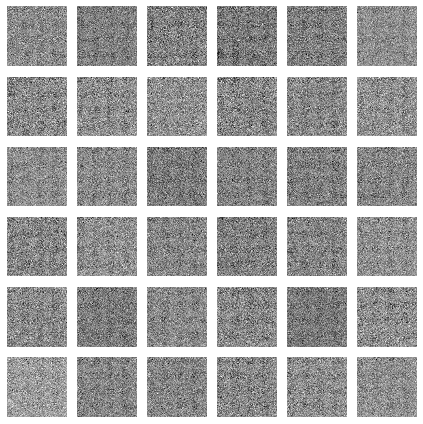

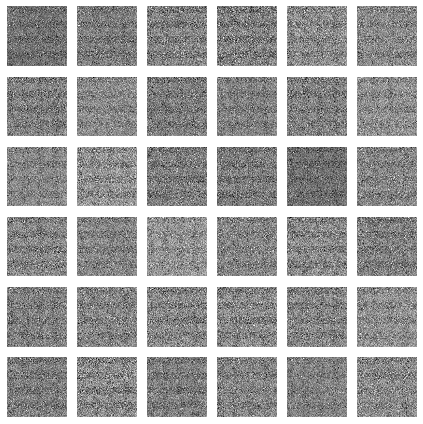

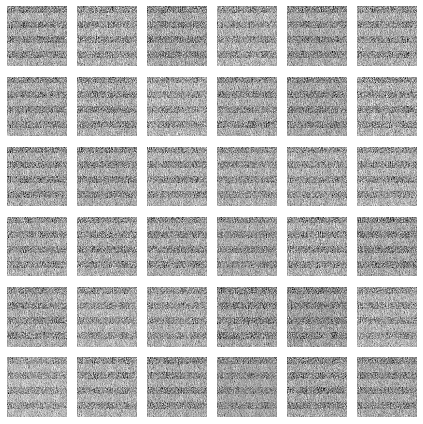

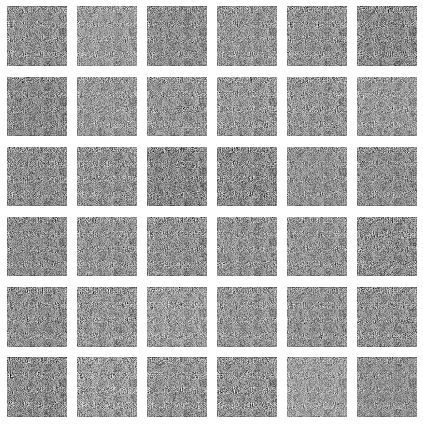

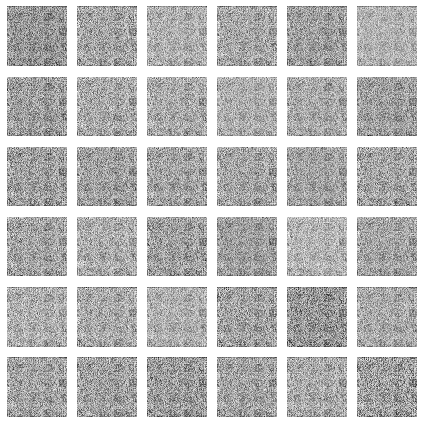

...

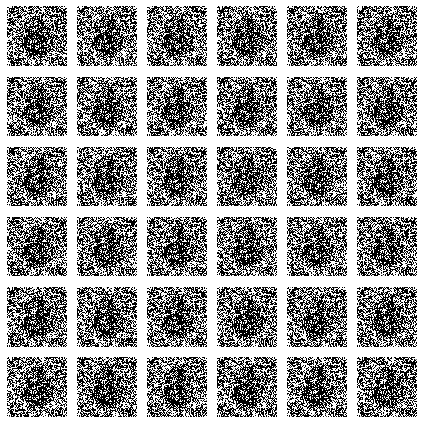

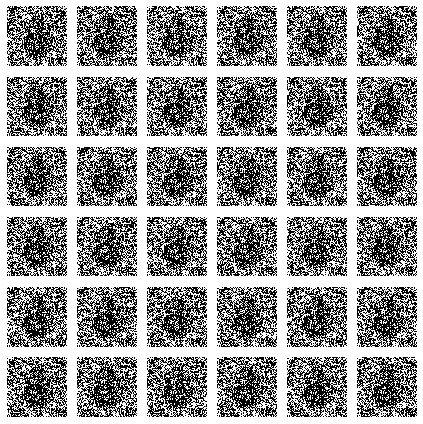

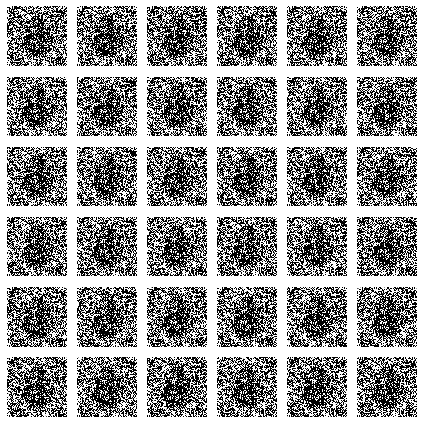

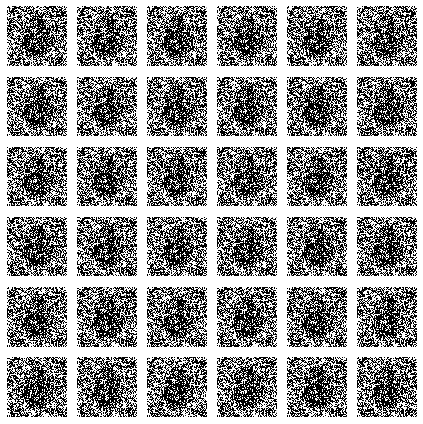

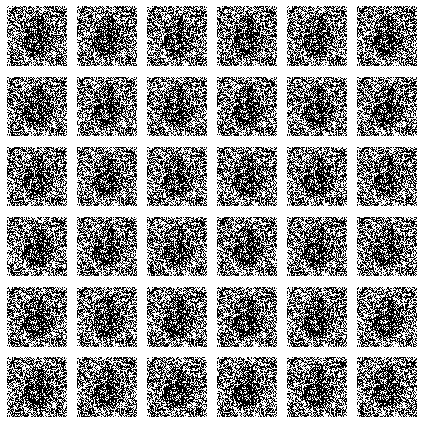

In [99]:
training(epochs=3000)